We start by adding the necessary folders to the current working path.

In [1]:
# import sys/os
import sys, os

# get current directory
path = os.getcwd()

# get parent directory
parent_directory = os.path.sep.join(path.split(os.path.sep))

from findiff import FinDiff, Laplacian

import matplotlib
from math import sqrt
from numba import njit, prange
from tqdm.notebook import tqdm

# Optionally set font to Computer Modern to avoid common missing font errors
matplotlib.rc('font', family='serif', serif='cm10')

matplotlib.rc('text', usetex=True)
matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']

# Disable
def blockPrint():
    sys.stdout = open(os.devnull, 'w')

# Restore
def enablePrint():
    sys.stdout = sys.__stdout__

/Users/alexencinasbartos/anaconda3/envs/TBarrier/lib/python3.7/site-packages/ipykernel_launcher.py:21: MatplotlibDeprecationWarning: Support for setting an rcParam that expects a str value to a non-str value is deprecated since 3.5 and support will be removed two minor releases later.


In [2]:
# define parula map
from matplotlib.colors import LinearSegmentedColormap

cm_data = [[0.2081, 0.1663, 0.5292], [0.2116238095, 0.1897809524, 0.5776761905], 
 [0.212252381, 0.2137714286, 0.6269714286], [0.2081, 0.2386, 0.6770857143], 
 [0.1959047619, 0.2644571429, 0.7279], [0.1707285714, 0.2919380952, 
  0.779247619], [0.1252714286, 0.3242428571, 0.8302714286], 
 [0.0591333333, 0.3598333333, 0.8683333333], [0.0116952381, 0.3875095238, 
  0.8819571429], [0.0059571429, 0.4086142857, 0.8828428571], 
 [0.0165142857, 0.4266, 0.8786333333], [0.032852381, 0.4430428571, 
  0.8719571429], [0.0498142857, 0.4585714286, 0.8640571429], 
 [0.0629333333, 0.4736904762, 0.8554380952], [0.0722666667, 0.4886666667, 
  0.8467], [0.0779428571, 0.5039857143, 0.8383714286], 
 [0.079347619, 0.5200238095, 0.8311809524], [0.0749428571, 0.5375428571, 
  0.8262714286], [0.0640571429, 0.5569857143, 0.8239571429], 
 [0.0487714286, 0.5772238095, 0.8228285714], [0.0343428571, 0.5965809524, 
  0.819852381], [0.0265, 0.6137, 0.8135], [0.0238904762, 0.6286619048, 
  0.8037619048], [0.0230904762, 0.6417857143, 0.7912666667], 
 [0.0227714286, 0.6534857143, 0.7767571429], [0.0266619048, 0.6641952381, 
  0.7607190476], [0.0383714286, 0.6742714286, 0.743552381], 
 [0.0589714286, 0.6837571429, 0.7253857143], 
 [0.0843, 0.6928333333, 0.7061666667], [0.1132952381, 0.7015, 0.6858571429], 
 [0.1452714286, 0.7097571429, 0.6646285714], [0.1801333333, 0.7176571429, 
  0.6424333333], [0.2178285714, 0.7250428571, 0.6192619048], 
 [0.2586428571, 0.7317142857, 0.5954285714], [0.3021714286, 0.7376047619, 
  0.5711857143], [0.3481666667, 0.7424333333, 0.5472666667], 
 [0.3952571429, 0.7459, 0.5244428571], [0.4420095238, 0.7480809524, 
  0.5033142857], [0.4871238095, 0.7490619048, 0.4839761905], 
 [0.5300285714, 0.7491142857, 0.4661142857], [0.5708571429, 0.7485190476, 
  0.4493904762], [0.609852381, 0.7473142857, 0.4336857143], 
 [0.6473, 0.7456, 0.4188], [0.6834190476, 0.7434761905, 0.4044333333], 
 [0.7184095238, 0.7411333333, 0.3904761905], 
 [0.7524857143, 0.7384, 0.3768142857], [0.7858428571, 0.7355666667, 
  0.3632714286], [0.8185047619, 0.7327333333, 0.3497904762], 
 [0.8506571429, 0.7299, 0.3360285714], [0.8824333333, 0.7274333333, 0.3217], 
 [0.9139333333, 0.7257857143, 0.3062761905], [0.9449571429, 0.7261142857, 
  0.2886428571], [0.9738952381, 0.7313952381, 0.266647619], 
 [0.9937714286, 0.7454571429, 0.240347619], [0.9990428571, 0.7653142857, 
  0.2164142857], [0.9955333333, 0.7860571429, 0.196652381], 
 [0.988, 0.8066, 0.1793666667], [0.9788571429, 0.8271428571, 0.1633142857], 
 [0.9697, 0.8481380952, 0.147452381], [0.9625857143, 0.8705142857, 0.1309], 
 [0.9588714286, 0.8949, 0.1132428571], [0.9598238095, 0.9218333333, 
  0.0948380952], [0.9661, 0.9514428571, 0.0755333333], 
 [0.9763, 0.9831, 0.0538]]

parula_map = LinearSegmentedColormap.from_list('parula', cm_data)

cmapToUse = parula_map

import matplotlib.pyplot as plt

# Import data

In [3]:
# import scipy
import scipy.io as sio

directory_data = parent_directory+"/data/3D/JHTDB/"

# import numpy
import numpy as np

U = sio.loadmat(directory_data+'U.mat')['U'][:,:,:,0] # array (NY, NX, NZ)
V = sio.loadmat(directory_data+'V.mat')['V'][:,:,:,0] # array (NY, NX, NZ)
W = sio.loadmat(directory_data+'W.mat')['W'][:,:,:,0] # array (NY, NX, NZ)

lap_U = sio.loadmat(directory_data+'Lap_U.mat')['Lap_U'][:,:,:,0] # array (NY, NX, NZ)
lap_V = sio.loadmat(directory_data+'Lap_V.mat')['Lap_V'][:,:,:,0] # array (NY, NX, NZ)
lap_W = sio.loadmat(directory_data+'Lap_W.mat')['Lap_W'][:,:,:,0] # array (NY, NX, NZ)

lap_bx = sio.loadmat(directory_data+'Lap_Bx.mat')['Lap_Bx'][:,:,:,0] # array (NY, NX, NZ)
lap_by = sio.loadmat(directory_data+'Lap_By.mat')['Lap_By'][:,:,:,0] # array (NY, NX, NZ)
lap_bz = sio.loadmat(directory_data+'Lap_Bz.mat')['Lap_Bz'][:,:,:,0] # array (NY, NX, NZ)

Bx = sio.loadmat(directory_data+'Bx.mat')['Bx'][:,:,:,0] # array (NY, NX, NZ)
By = sio.loadmat(directory_data+'By.mat')['By'][:,:,:,0] # array (NY, NX, NZ)
Bz = sio.loadmat(directory_data+'Bz.mat')['Bz'][:,:,:,0] # array (NY, NX, NZ)

x = sio.loadmat(directory_data+'X.mat')['x'][:,:] # array (1, NX)
y = sio.loadmat(directory_data+'Y.mat')['y'][:,:] # array (1, NY)
z = sio.loadmat(directory_data+'Z.mat')['z'][:,:] # array (1, NY)

nu = 1.1*10**(-4)
eta = nu

dx = x[0,1]-x[0,0]
dy = y[0,1]-y[0,0]
dz = z[0,1]-z[0,0]

from scipy.ndimage import gaussian_filter
sigma = 3

dzOp = FinDiff(2, dz)
dxOp = FinDiff(1, dx)
dyOp = FinDiff(0, dy)

U = gaussian_filter(U, sigma=sigma)
V = gaussian_filter(V, sigma=sigma)
W = gaussian_filter(W, sigma=sigma)

Bx = gaussian_filter(Bx, sigma=sigma)
By = gaussian_filter(By, sigma=sigma)
Bz = gaussian_filter(Bz, sigma=sigma)

lap_U = nu*gaussian_filter(lap_U, sigma=sigma)
lap_V = nu*gaussian_filter(lap_V, sigma=sigma)
lap_W = nu*gaussian_filter(lap_W, sigma=sigma)

lap_bx = eta*gaussian_filter(lap_bx, sigma=sigma)
lap_by = eta*gaussian_filter(lap_by, sigma=sigma)
lap_bz = eta*gaussian_filter(lap_bz, sigma=sigma)

# Omega
jx = dyOp(Bz) - dzOp(By)
jy = dzOp(Bx) - dxOp(Bz)
jz = dxOp(By) - dyOp(Bx)

# Omega
wx = dyOp(W) - dzOp(V)
wy = dzOp(U) - dxOp(W)
wz = dxOp(V) - dyOp(U)

j = np.sqrt(jx**2+jy**2+jz**2)
omega = np.sqrt(wx**2+wy**2+wz**2)
Lap_vel = np.sqrt(lap_U**2+lap_V**2+lap_W**2)
Lap_B = np.sqrt(lap_bx**2+lap_by**2+lap_bz**2)

d_Lap_Bdx = dxOp(Lap_B)
d_Lap_Bdy = dyOp(Lap_B)

dd_Lap_B_dxdx = dxOp(dxOp(Lap_B))
dd_Lap_B_dxdy = dxOp(dyOp(Lap_B))
dd_Lap_B_dydx = dyOp(dxOp(Lap_B))
dd_Lap_B_dydy = dyOp(dyOp(Lap_B))

d_Lap_veldx = dxOp(Lap_vel)
d_Lap_veldy = dyOp(Lap_vel)

dd_Lap_vel_dxdx = dxOp(dxOp(Lap_vel))
dd_Lap_vel_dxdy = dxOp(dyOp(Lap_vel))
dd_Lap_vel_dydx = dyOp(dxOp(Lap_vel))
dd_Lap_vel_dydy = dyOp(dyOp(Lap_vel))

X, Y, Z = np.meshgrid(x, y, z) # array (NY, NX), array (NY, NX, NZ)

# Setup

Specifiy domain over which we compute the Eulerian barriers.

In [4]:
# boundaries
xmin = 2 # float (3.2, 3), 0.5, 0.5
xmax = 4 # float 
ymin = 2 # float
ymax = 4 # float
zmin = 2 # float
zmax = 3 # float

x1 = xmin # float
x2 = xmax # float
y1 = ymin # float
y2 = ymax # float

# zoomed inset

# Resolution of meshgrid
Ny = 200 # int
Nx = 200 # int
Nz = 100

xticks = [2.0, 3.0, 4.0]
yticks = [2.0, 3.0, 4.0]
zticks = [2.0, 3.0]

xticklabels = [r'$2$', r'$3$', r'$4$']
yticklabels =  [r'$2$', r'$3$', r'$4$']
zticklabels =  [r'$2.$', r'$3$']

x_domain = np.linspace(xmin, xmax, Nx, endpoint = True) # array (Nx, )
y_domain = np.linspace(ymin, ymax, Ny, endpoint = True) # array (Ny, )
z_domain = np.linspace(zmin, zmax, Nz, endpoint = True) # array (Nz, )

dx = x_domain[1]-x_domain[0] # float
dy = y_domain[1]-y_domain[0] # float
dz = z_domain[1]-z_domain[0] # float

X_domain, Y_domain, Z_domain = np.meshgrid(x_domain, y_domain, z_domain) # array (Ny, Nx)

# Interpolation

In [5]:
# import Rectangular bivariate spline from scipy
from scipy.interpolate import RegularGridInterpolator

def interpolant_steady(X, Y, Z, U, V, W):
    '''
    Steady wrapper for scipy.interpolate.RegularGridInterpolator. Creates a list of interpolators for u, v and w velocities
    
    Parameters:
        X: array (Ny, Nx, Nz), X-meshgrid
        Y: array (Ny, Nx, Nz), Y-meshgrid
        Z: array (Ny, Nx, Nz), Y-meshgrid
        U: array (Ny, Nx, Nz), U velocity
        V: array (Ny, Nx, Nz), V velocity
        W: array (Ny, Nx, Nz), W velocity
        interpolation_method: Method for interpolation. Scipy default is 'linear', can be 'nearest'
    
    Returns:
        Interpolant: list (3,), U, V and W interpolators
    '''
    
    Interpolant = []
        
    Interpolant.append(RegularGridInterpolator((Y[:,0,0], X[0,:,0], Z[0,0,:]),
                                               U, bounds_error = False, fill_value = 0))
    Interpolant.append(RegularGridInterpolator((Y[:,0,0], X[0,:,0], Z[0,0,:]),
                                               V, bounds_error = False, fill_value = 0))
    Interpolant.append(RegularGridInterpolator((Y[:,0,0], X[0,:,0], Z[0,0,:]),
                                               W, bounds_error = False, fill_value = 0))
    
    return Interpolant

# Interpolate velocity data using cubic spatial interpolation
Interpolant_momentum_barriers = interpolant_steady(X, Y, Z, lap_U, lap_V, lap_W)

Interpolant_lap_u = Interpolant_momentum_barriers[0] # RectangularBivariateSpline-object
Interpolant_lap_v = Interpolant_momentum_barriers[1] # RectangularBivariateSpline-object
Interpolant_lap_w = Interpolant_momentum_barriers[2] # RectangularBivariateSpline-object

# Interpolate velocity data using cubic spatial interpolation
Interpolant_magnetic_barriers = interpolant_steady(X, Y, Z, lap_bx, lap_by, lap_bz)

Interpolant_lap_bx = Interpolant_magnetic_barriers[0] # RectangularBivariateSpline-object
Interpolant_lap_by = Interpolant_magnetic_barriers[1] # RectangularBivariateSpline-object
Interpolant_lap_bz = Interpolant_magnetic_barriers[2] # RectangularBivariateSpline-object

# Interpolate x-y derivatives of the norm of the laplace(B)
Interpolant_derivatives_Lap_b = interpolant_steady(X, Y, Z, dd_Lap_B_dxdx, dd_Lap_B_dxdy, dd_Lap_B_dydy)

Interpolant_dd_lap_b_dxdx = Interpolant_derivatives_Lap_b[0]
Interpolant_dd_lap_b_dxdy = Interpolant_derivatives_Lap_b[1]
Interpolant_dd_lap_b_dydy = Interpolant_derivatives_Lap_b[2]

# Interpolate x-y derivatives of the norm of the laplace(vel)
Interpolant_derivatives_Lap_vel = interpolant_steady(X, Y, Z, dd_Lap_vel_dxdx, dd_Lap_vel_dxdy, dd_Lap_vel_dydy)

Interpolant_dd_lap_vel_dxdx = Interpolant_derivatives_Lap_vel[0]
Interpolant_dd_lap_vel_dxdy = Interpolant_derivatives_Lap_vel[1]
Interpolant_dd_lap_vel_dydy = Interpolant_derivatives_Lap_vel[2]

# Interpolate electric current density field
Interpolant_j = interpolant_steady(X, Y, Z, jx, jy, jz)

Interpolant_jx = Interpolant_j[0]
Interpolant_jy = Interpolant_j[1]
Interpolant_jz = Interpolant_j[2]

# Interpolate vorticity field
Interpolant_omega = interpolant_steady(X, Y, Z, wx, wy, wz)

Interpolant_wx = Interpolant_omega[0]
Interpolant_wy = Interpolant_omega[1]
Interpolant_wz = Interpolant_omega[2]

In [6]:
# compute velocity
def velocity(x, Interpolant_u, Interpolant_v, Interpolant_w):
    
    x_swap = np.zeros((x.shape[1], x.shape[0]))
    x_swap[:,0] = x[1,:]
    x_swap[:,1] = x[0,:]
    x_swap[:,2] = x[2,:]
    
    u = Interpolant_u(x_swap)
    v = Interpolant_v(x_swap)
    w = Interpolant_w(x_swap)
    
    vel = np.array([u, v, w])

    return vel

# compute laplacian of magnetic field over domain
def get_Lap_b_domain(x0, y0, z0, Nx = Nx, Ny = Ny, Nz = Nz):
    
    x = np.array([x0, y0, z0])
    Lap_B_domain = velocity(x, Interpolant_lap_bx, Interpolant_lap_by, Interpolant_lap_bz).reshape(3, Ny, Nx, Nz)
    
    return np.linalg.norm(Lap_B_domain, axis = 0, ord = 2), Lap_B_domain

# compute laplacian of velocity field over domain
def get_Lap_vel_domain(x0, y0, z0, Nx = Nx, Ny = Ny, Nz = Nz):
    
    x = np.array([x0, y0, z0])
    Lap_vel_domain = velocity(x, Interpolant_lap_u, Interpolant_lap_v, Interpolant_lap_w).reshape(3, Ny, Nx, Nz)
    
    return np.linalg.norm(Lap_vel_domain, axis = 0, ord = 2), Lap_vel_domain

# compute electric current density field
def get_J_domain(x0, y0, z0, Nx = Nx, Ny = Ny, Nz = Nz):
    
    x = np.array([x0, y0, z0])
    
    J_domain = velocity(x, Interpolant_jx, Interpolant_jy, Interpolant_jz).reshape(3, Ny, Nx, Nz)
    
    return np.linalg.norm(J_domain, axis = 0, ord = 2), J_domain

# compute vorticity field
def get_Omega_domain(x0, y0, z0, Nx = Nx, Ny = Ny, Nz = Nz):
    
    x = np.array([x0, y0, z0])
    
    Omega_domain = velocity(x, Interpolant_wx, Interpolant_wy, Interpolant_wz).reshape(3, Ny, Nx, Nz)
    
    return np.linalg.norm(Omega_domain, axis = 0, ord = 2), Omega_domain

x0 = X_domain.ravel()
y0 = Y_domain.ravel()
z0 = Z_domain.ravel()

Lap_b_domain_norm_3D, Lap_b_domain_3D = get_Lap_b_domain(x0, y0, z0)
Lap_vel_domain_norm_3D, Lap_vel_domain_3D = get_Lap_vel_domain(x0, y0, z0)
J_domain_norm_3D, J_domain_3D = get_J_domain(x0, y0, z0)
Omega_domain_norm_3D, Omega_domain_3D = get_Omega_domain(x0, y0, z0)

# Ridge Extraction

Here we identify the ridges of the $ ABS $-field computed over a cross-sectional domain using the Hessian of the $ ABS $-field. For more details we refer to [1].

[1] Lindeberg, T. (1998). Edge detection and ridge detection with automatic scale selection. International journal of computer vision, 30, 117-156.

In [7]:
# compute hessian
def get_H(x0, y0, z0, Interpolant_dd_lap_dxdx, Interpolant_dd_lap_dxdy, Interpolant_dd_lap_dydy):
    
    x = np.array([x0, y0, z0]).reshape(3,-1)
    
    H = np.zeros((2, 2, x.shape[1]))
    
    H_elements = velocity(x, Interpolant_dd_lap_dxdx, Interpolant_dd_lap_dxdy, Interpolant_dd_lap_dydy)
    
    H[0,0,:] = H_elements[0,:]
    H[0,1,:] = H_elements[1,:]
    H[1,0,:] = H[0,1]
    H[1,1,:] = H_elements[2,:]
    
    return H
    
# compute eigenvectors and eigenvalues of Hessian
def get_eigen_single(H):
    
    a = H[0,0]
    b = H[0,1]
    c = H[1,1]
    D = sqrt(((a-c)/2)**2+b**2)
    
    eig_min, eig_max = (a+c)/2-D, (a+c)/2+D
    eigenv_min = np.array([(a-c-sqrt((a-c)**2+4*b**2))/(2*b), 1])
    eigenv_max = np.array([(a-c+sqrt((a-c)**2+4*b**2))/(2*b), 1])

    return eig_min, eig_max, eigenv_min, eigenv_max
    
# compute eigenvectors and eigenvalues of Hessian over the field
def get_eigen(H):
    eig, eigenv = np.zeros((2, H.shape[-1])), np.zeros((2, 2, H.shape[-1]))

    for i in prange(H.shape[-1]):
        eig[0,i], eig[1,i], eigenv[0,:,i], eigenv[1,:,i] = get_eigen_single(H[:,:,i])
                
        eigenv[0,:,i] /= sqrt(eigenv[0,0,i]**2+eigenv[0,1,i]**2)
        eigenv[1,:,i] /= sqrt(eigenv[1,0,i]**2+eigenv[1,1,i]**2)
                
    return eig, eigenv

Nx_ridge = 100
Ny_ridge = 100
Nz_ridge = 100

x_domain_ridge = np.linspace(x1, x2, Nx_ridge)
y_domain_ridge = np.linspace(y1, y2, Ny_ridge)

X_domain_ridge, Y_domain_ridge = np.meshgrid(x_domain_ridge, y_domain_ridge)

x0 = X_domain_ridge.ravel()
y0 = Y_domain_ridge.ravel()
z0 = zmax*np.ones(X_domain_ridge.shape).ravel()

In [8]:
def get_loc_extrema(X, Y, H, threshold):

    # Import math tools
    from math import sqrt
    
    # find local maxima
    peak_idx_x, peak_idx_y, peak_x, peak_y, peak_field = _find_all_local_maxima(X, Y, H, threshold)
    
    return list(peak_idx_x), list(peak_idx_y), list(peak_x), list(peak_y), list(peak_field)
    
@njit()
def _find_all_local_maxima(X, Y, H, threshold):
    '''
    Find all local maxima in a scalar field.

    Parameters:
        X: array (Nx, Ny), X-meshgrid
        Y: array (Nx, Ny), Y-meshgrid
        H: array(Nx, Ny), Scalar field to analyze
        
    Returns:
        idx_x: X position in the grid of the maxima 
        idx_y: Y position in the grid of the maxima
        loc_max_x: X position of the maxima (loc_max_x = X[idx_x, idx_y])
        loc_max_y: Y position of the maxima (loc_max_y = Y[idx_x, idx_y])
        loc_max_field: value of the maxima
    '''            
    loc_max_x, loc_max_y, loc_max_field = [], [], []
    idx_x, idx_y = [], []
            
    for i in range(2, X.shape[0]-2):
                
        for j in range(2, Y.shape[1]-2):
                    
            if H[i,j] > threshold and np.isfinite(H[i, j]) and H[i, j] > H[i+1, j] and H[i, j] > H[i-1, j] and H[i, j] > H[i, j+1] and H[i, j] > H[i, j-1]:
                
                loc_max_x.append(X[i, j])
                loc_max_y.append(Y[i, j])
                loc_max_field.append(H[i, j])
                idx_x.append(j)
                idx_y.append(i)
    
    return idx_x, idx_y, loc_max_x, loc_max_y, loc_max_field

def sort_algorithm(arg_sort, list_):

    sorted_list = []
    
    for a in arg_sort:
        sorted_list.append(list_[a])

    return sorted_list

# import interpolate
import scipy.interpolate as interpolate

def get_ABS(x0, y0, z0, Interpolant_x, Interpolant_y, Interpolant_z):
    
    x = np.array([x0, y0, z0]).reshape(3,-1)
    
    ABS = np.linalg.norm(velocity(x, Interpolant_x, Interpolant_y, Interpolant_z), axis = 0, ord = 2)
    
    return ABS

# Forward-Euler integration scheme
def _integration(x0, y0, z0, Interpolant_lap_x, Interpolant_lap_y, Interpolant_lap_z, 
                 Interpolant_dd_lap_dxdx, Interpolant_dd_lap_dxdy, Interpolant_dd_lap_dydy, 
                 lap_threshold = 0, epsilon = 0, init_sign = 1):
    
    # stepping of integration of ridge-lines
    ds = 1*10**(-3)
    
    # ridge-lines compute from tensorlines of the weakest eigenvector field of the hessian.
    # ridge-lines will be stored in the list 'intergration_lines'
    integration_lines = []
    
    # get Hessian
    H = get_H(x0, y0, z0, Interpolant_dd_lap_dxdx, Interpolant_dd_lap_dxdy, Interpolant_dd_lap_dydy)[:,:,0]
    
    # compute eigenvalues/eigenvectors of Hessian
    lambda_min, lambda_max, eigen_min, eigen_max = get_eigen_single(H)
    
    # compute ABS field
    ABS = get_ABS(x0, y0, z0, Interpolant_lap_x, Interpolant_lap_y, Interpolant_lap_z) 
    
    # compute ratios of eigenvalues
    ratio_eig = abs(lambda_max)/abs(lambda_min)
    
    # start integration
    while ratio_eig < epsilon and lambda_min < 0 and ABS > lap_threshold:
        
        # get local Hessian
        H = get_H(x0, y0, z0, Interpolant_dd_lap_dxdx, Interpolant_dd_lap_dxdy, Interpolant_dd_lap_dydy)[:,:,0]
    
        # get local eigenvalues/eigenvectors of Hessian
        lambda_min, lambda_max, eigen_min, eigen_max = get_eigen_single(H)
        
        # get local ABS
        ABS = get_ABS(x0, y0, z0, Interpolant_lap_x, Interpolant_lap_y, Interpolant_lap_z)
        ratio_eig = abs(lambda_max)/abs(lambda_min)
        
        # renormalize during integration to speed up calculations and guarantee accurate tensorlines.
        scaling = ((abs(lambda_min)-abs(lambda_max))**2/(abs(lambda_min)+abs(lambda_max))**2)*ds
        
        # define initial condition and first integration step
        if len(integration_lines) == 0:
            
            x0_prev, y0_prev = x0, y0
            
            # norm of eigenvector field so that we can then compute the unit eigenvector
            eigennorm = sqrt(eigen_max[0]**2+eigen_max[1]**2)
            
            x0 = x0 + init_sign*scaling*eigen_max[0]/eigennorm
            y0 = y0 + init_sign*scaling*eigen_max[1]/eigennorm
            
            # break if initial conditions outside of the domain.
            if x0 < xmin or x0 > xmax or y0 < ymin or y0 > ymax:
                break
            
            # append point
            integration_lines.append([x0, y0])
            
        else:
            
            # compute sign to reorient vector field in the direction we are integrating
            sign = np.sign((x0-x0_prev)*eigen_max[0]+(y0-y0_prev)*eigen_max[1])
            scaling *= sign
            
            x0_prev, y0_prev = x0, y0
            
            # norm of eigenvector field so that we can then compute the unit eigenvector
            eigennorm = sqrt(eigen_max[0]**2+eigen_max[1]**2)
            
            x0 = x0 + scaling*eigen_max[0]/eigennorm
            y0 = y0 + scaling*eigen_max[1]/eigennorm
            
            # break if point outside of the domain.
            if x0 < xmin or x0 > xmax or y0 < ymin or y0 > ymax:
                break
            
             # append point
            integration_lines.append([x0, y0])
    
    # append ridgelines only if tensorlines exist in both integration directions.
    if len(integration_lines) > 2:
        integration_lines = np.array(integration_lines).transpose()
        return integration_lines
    else:
        return None

# compute length of line
def get_length(line):
    
    ''' 
    line: array of shape (2, N)
    '''
    
    L = 0
    
    # compute length of line by iterating
    for i in range(line.shape[-1]-1):
        L += sqrt(abs(line[0,i+1]-line[0,i])**2+abs(line[1,i+1]-line[1,i])**2)
        
    return L

# Get |laplace(B)|, |laplace(B)|
Lap_b_domain_norm, Lap_b_domain = get_Lap_b_domain(x0, y0, z0, Nx = Nx_ridge, Ny = Ny_ridge, Nz = 1)
# Get |j|, j
J_domain_norm, J_domain = get_J_domain(x0, y0, z0, Nx = Nx_ridge, Ny = Ny_ridge, Nz = 1)

# threshold when we stop the integration
lap_b_threshold = Lap_b_domain_norm.mean()

# find local maxima
idx_x, idx_y, loc_ext_x, loc_ext_y, loc_ext_field = get_loc_extrema(X_domain_ridge, Y_domain_ridge, Lap_b_domain_norm[:,:,0], lap_b_threshold)

# sort local maxima in descending order
arg_sort = np.flip(np.argsort(loc_ext_field))
loc_ext_x = sort_algorithm(arg_sort, loc_ext_x)
loc_ext_y = sort_algorithm(arg_sort, loc_ext_y)
loc_ext_field = sort_algorithm(arg_sort, loc_ext_field)
    
# Ridge extraction parameters

# paramater that defines how strict we are on the ridge definition. 
# we stop integration whenever the ratio between the minimal and maximum eigenvalue of the hessian is above epsilon
epsilon = 0.3

# minimal length of ridge
Lmin = 0.5

# minimal distance between two ridges
min_dist = 0.05

# number of points that define a ridge; do not set this too high otherwise computational time explodes
N_points = 1000

ridges, loc_ridge_max = [], []
x_barriers, y_barriers = [], []
lap_threshold = lap_b_threshold

for i in tqdm(range(len(loc_ext_x))):
    
    # integrate forward
    integration_lines_forward = _integration(loc_ext_x[i], loc_ext_y[i], zmax, 
                                             Interpolant_lap_bx, Interpolant_lap_by, Interpolant_lap_bz,
                                             Interpolant_dd_lap_b_dxdx, Interpolant_dd_lap_b_dxdy, Interpolant_dd_lap_b_dydy,
                                             lap_threshold, epsilon, init_sign = 1)
    
    # integrate backward
    integration_lines_backward = _integration(loc_ext_x[i], loc_ext_y[i], zmax, 
                                              Interpolant_lap_bx, Interpolant_lap_by, Interpolant_lap_bz,
                                              Interpolant_dd_lap_b_dxdx, Interpolant_dd_lap_b_dxdy, Interpolant_dd_lap_b_dydy,
                                              lap_threshold, epsilon, init_sign = -1)
    
    if integration_lines_forward is not None and integration_lines_backward is not None:
        integration_line = np.append(np.flip(integration_lines_backward, axis = 1), integration_lines_forward[:,1:], axis = 1)
    elif integration_lines_forward is not None and integration_lines_backward is None:
        integration_line = integration_lines_forward
    elif integration_lines_forward is None and integration_lines_backward is not None:
        integration_line = integration_lines_backward
    else:
        integration_line = np.zeros((2, 3))
    
    # get length
    L = get_length(integration_line)
    
    bool_add = True

    if L > Lmin:
        if len(ridges) == 0:
            tck, u = interpolate.splprep([integration_line[0,:], integration_line[1,:]], s=0.0000001)
            xi, yi = interpolate.splev(np.linspace(0, 1, N_points), tck)
            for j in range(xi.shape[0]):
                x_barriers.append(xi[j])
                y_barriers.append(yi[j])
            ridges.append(np.array([xi, yi]))
            loc_ridge_max.append([loc_ext_x[i], loc_ext_y[i]])
        else:
            for k in range(0, len(x_barriers), 5):
                dist = np.sqrt((integration_line[0,:]-x_barriers[k])**2+(integration_line[1,:]-y_barriers[k])**2).min()  
                if dist < min_dist:
                    bool_add = False
                    break
            if bool_add:
                tck, u = interpolate.splprep([integration_line[0,:], integration_line[1,:]], s=0.000001)
                xi, yi = interpolate.splev(np.linspace(0, 1, N_points), tck)
                for j in range(xi.shape[0]):
                    x_barriers.append(xi[j])
                    y_barriers.append(yi[j])
                ridges.append(np.array([xi, yi]))
                loc_ridge_max.append([loc_ext_x[i], loc_ext_y[i]])

ridges_mag = ridges.copy()

  0%|          | 0/207 [00:00<?, ?it/s]

In [9]:
# Get |laplace(B)|, |laplace(B)|
Lap_vel_domain_norm, Lap_vel_domain = get_Lap_vel_domain(x0, y0, z0, Nx = Nx_ridge, Ny = Ny_ridge, Nz = 1)

# Get |omega|, omega
Omega_domain_norm, Omega_domain = get_Omega_domain(x0, y0, z0, Nx = Nx_ridge, Ny = Ny_ridge, Nz = 1)

# threshold when we stop the integration
lap_vel_threshold = Lap_vel_domain_norm.mean()

# find local maxima
idx_x, idx_y, loc_ext_x, loc_ext_y, loc_ext_field = get_loc_extrema(X_domain_ridge, Y_domain_ridge, Lap_vel_domain_norm[:,:,0], lap_vel_threshold)

# sort local maxima in descending order
arg_sort = np.flip(np.argsort(loc_ext_field))
loc_ext_x = sort_algorithm(arg_sort, loc_ext_x)
loc_ext_y = sort_algorithm(arg_sort, loc_ext_y)
loc_ext_field = sort_algorithm(arg_sort, loc_ext_field)

# Ridge extraction parameters

# paramater that defines how strict we are on the ridge definition. 
# we stop integration whenever the ratio between the minimal and maximum eigenvalue of the hessian is above epsilon
epsilon = 0.5

# minimal length of ridge
Lmin = 0.5

# minimal distance between two ridges
min_dist = 0.05

# number of points that define a ridge; do not set this too high otherwise computational time explodes
N_points = 1000

ridges, loc_ridge_max = [], []
x_barriers, y_barriers = [], []
lap_threshold = lap_vel_threshold

for i in tqdm(range(len(loc_ext_x))):
    
    # integrate forward
    integration_lines_forward = _integration(loc_ext_x[i], loc_ext_y[i], zmax, 
                                             Interpolant_lap_u, Interpolant_lap_v, Interpolant_lap_w,
                                             Interpolant_dd_lap_vel_dxdx, Interpolant_dd_lap_vel_dxdy, Interpolant_dd_lap_vel_dydy,
                                             lap_threshold, epsilon, init_sign = 1)
    
    # integrate backward
    integration_lines_backward = _integration(loc_ext_x[i], loc_ext_y[i], zmax, 
                                              Interpolant_lap_u, Interpolant_lap_v, Interpolant_lap_w,
                                              Interpolant_dd_lap_vel_dxdx, Interpolant_dd_lap_vel_dxdy, Interpolant_dd_lap_vel_dydy,
                                              lap_threshold, epsilon, init_sign = -1)
    
    if integration_lines_forward is not None and integration_lines_backward is not None:
        integration_line = np.append(np.flip(integration_lines_backward, axis = 1), integration_lines_forward[:,1:], axis = 1)
    elif integration_lines_forward is not None and integration_lines_backward is None:
        integration_line = integration_lines_forward
    elif integration_lines_forward is None and integration_lines_backward is not None:
        integration_line = integration_lines_backward
    else:
        integration_line = np.zeros((2, 3))
    
    # get length
    L = get_length(integration_line)
    
    bool_add = True
    
    if L > Lmin:
        if len(ridges) == 0:
            tck, u = interpolate.splprep([integration_line[0,:], integration_line[1,:]], s=0.0000001)
            xi, yi = interpolate.splev(np.linspace(0, 1, N_points), tck)
            for j in range(xi.shape[0]):
                x_barriers.append(xi[j])
                y_barriers.append(yi[j])
            ridges.append(np.array([xi, yi]))
            loc_ridge_max.append([loc_ext_x[i], loc_ext_y[i]])
        else:
            for k in range(0, len(x_barriers), 5):
                dist = np.sqrt((integration_line[0,:]-x_barriers[k])**2+(integration_line[1,:]-y_barriers[k])**2).min()  
                if dist < min_dist:
                    bool_add = False
                    break
            if bool_add:
                tck, u = interpolate.splprep([integration_line[0,:], integration_line[1,:]], s=0.000001)
                xi, yi = interpolate.splev(np.linspace(0, 1, N_points), tck)
                for j in range(xi.shape[0]):
                    x_barriers.append(xi[j])
                    y_barriers.append(yi[j])
                ridges.append(np.array([xi, yi]))
                loc_ridge_max.append([loc_ext_x[i], loc_ext_y[i]])

ridges_mom = ridges.copy()

  0%|          | 0/190 [00:00<?, ?it/s]

# Plot fields over 3D domain

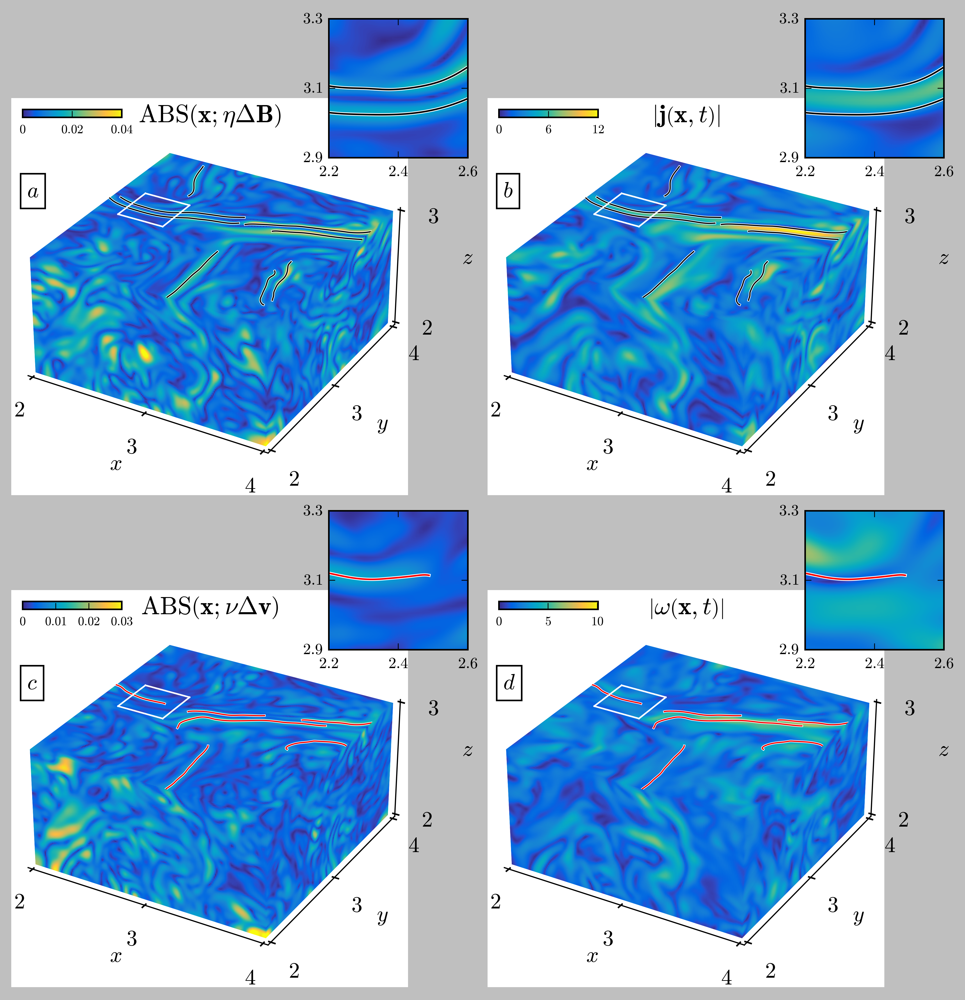

In [10]:
# plot

%matplotlib inline

from mpl_toolkits.axes_grid1.inset_locator import mark_inset, zoomed_inset_axes, inset_axes

x1, x2 = 2.2, 2.6
y1, y2 = 2.9, 3.3

x_zoom_ticks = [2.2, 2.4, 2.6]
y_zoom_ticks = [2.9, 3.1, 3.3]

x_zoom_ticklabels = [r'$2.2$', r'$2.4$', r'$2.6$']
y_zoom_ticklabels = [r'$ 2.9 $', r'$ 3.1 $', r'$ 3.3 $']

inset = [.8, .85, .35, .35]

plt.style.use('classic')

fontsize = 14

def colorfunction(scalar, min_value, max_value, reverse = False):
    
    cmapToUse = parula_map

    # fourth dimention - colormap
    # create colormap according to value
    color_dimension = scalar # change to desired fourth dimension
    norm = matplotlib.colors.Normalize(min_value, max_value)
    m = plt.cm.ScalarMappable(norm=norm, cmap=cmapToUse)
    m.set_array([])
    fcolors = m.to_rgba(color_dimension)
    
    return fcolors, m, cmapToUse

fig = plt.figure(figsize = (10, 10), dpi = 500)

ax00 = fig.add_subplot(222, projection='3d')
ax00.set_title(r'$\left| \mathbf{j} \left(\mathbf{x}, t\right)\right|$', fontsize = fontsize+2)
ax00.text(2, 2, 3.5, r'$b$', bbox=dict(boxstyle="square", ec="k", fc="w",), fontsize = fontsize)

ax00.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax00.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax00.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))

fcolors, m, cmapToUse = colorfunction(J_domain_norm_3D[:,:,-1], 0, 12)
ax00.plot_surface(X_domain[:,:,-1], Y_domain[:,:,-1], Z_domain[:,:,-1], lw=0.1, rstride=1, cstride=1, facecolors=fcolors, vmin=0, vmax=12, shade=False)
fcolors, m, cmapToUse = colorfunction(J_domain_norm_3D[:,-1,:], 0, 12)
ax00.plot_surface(X_domain[:,-1,:], Y_domain[:,-1,:], Z_domain[:,-1,:], lw=0.1, rstride=1, cstride=1, facecolors=fcolors, vmin=0, vmax=12, shade=False)
fcolors, m, cmapToUse = colorfunction(J_domain_norm_3D[0,:,:,], 0, 12)
ax00.plot_surface(X_domain[0,:,:], Y_domain[0,:,:], Z_domain[0,:,:], lw=0.1, rstride=1, cstride=1, facecolors=fcolors, vmin=0, vmax=12, shade=False)

cbaxes = inset_axes(ax00, width="25%", height="2%", loc="upper left") 
cbar = fig.colorbar(m, cax = cbaxes, orientation="horizontal",
                    ticks = [0, 6, 12])
cbar.ax.set_xticklabels([r'$0$', r'$6$', r'$12$'], fontsize = fontsize-6)

axins = ax00.inset_axes(inset)
axins.contourf(X_domain[:,:,-1], Y_domain[:,:,-1], J_domain_norm_3D[:,:,-1].reshape(Ny, Nx), cmap = cmapToUse, levels = 400, vmin=0, vmax=12)
    
for ridge in ridges_mag:
    axins.plot(ridge[0,:], ridge[1,:], c = "w", linewidth = 2, zorder = 2)
    axins.plot(ridge[0,:], ridge[1,:], c = "k", linewidth = 1, zorder = 2)

axins.set_xlim([x1, x2])
axins.set_ylim([y1, y2])

axins.set_xticks(x_zoom_ticks)
axins.set_yticks(y_zoom_ticks)

axins.set_xticklabels(x_zoom_ticklabels, fontsize = fontsize-4)
axins.set_yticklabels(y_zoom_ticklabels, fontsize = fontsize-4)

ax00.set_xticks(xticks)
ax00.set_yticks(yticks)
ax00.set_zticks(zticks)

ax00.set_xticklabels(xticklabels, fontsize = fontsize)
ax00.set_yticklabels(yticklabels, fontsize = fontsize)
ax00.set_zticklabels(zticklabels, fontsize = fontsize)

ax00.set_xlabel(r'$x$', fontsize = fontsize)
ax00.set_ylabel(r'$y$', fontsize = fontsize)
ax00.set_zlabel(r'$z$', fontsize = fontsize)

# plot insets
ax00.plot(np.linspace(x1, x2, 10), np.linspace(y1, y1, 10), np.linspace(zmax, zmax, 10), 
          linewidth = 1, zorder = 5, c = "w")
ax00.plot(np.linspace(x1, x2, 10), np.linspace(y2, y2, 10), np.linspace(zmax, zmax, 10), 
          linewidth = 1, zorder = 5, c = "w")
ax00.plot(np.linspace(x1, x1, 10), np.linspace(y1, y2, 10), np.linspace(zmax, zmax, 10), 
          linewidth = 1, zorder = 5, c = "w")
ax00.plot(np.linspace(x2, x2, 10), np.linspace(y1, y2, 10), np.linspace(zmax, zmax, 10), 
          linewidth = 1, zorder = 5, c = "w")

for ridge in ridges_mag:
    ax00.plot(ridge[0,:], ridge[1,:], np.linspace(zmax, zmax, ridge.shape[-1]), 
              linewidth = 1.5, zorder = 4, c = "w")
    ax00.plot(ridge[0,:], ridge[1,:], np.linspace(zmax, zmax, ridge.shape[-1]), 
              linewidth = 0.75, zorder = 4, c = "k")

ax00.set_box_aspect((1, 1, 0.5))
    
ax00.grid(False)

ax01 = fig.add_subplot(221, projection='3d')
ax01.set_title(r'$ \mathrm{ABS} \left(\mathbf{x}; \eta \Delta \mathbf{B}\right)$', fontsize = fontsize+2)
ax01.text(2, 2, 3.5, r'$a$', bbox=dict(boxstyle="square", ec="k", fc="w",), fontsize = fontsize)

ax01.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax01.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax01.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))

fcolors, m, cmapToUse = colorfunction(Lap_b_domain_norm_3D[:,:,-1], 0, 0.04)
ax01.plot_surface(X_domain[:,:,-1], Y_domain[:,:,-1], Z_domain[:,:,-1], lw=0.1, rstride=1, cstride=1, facecolors=fcolors, vmin=0, vmax=0.04, shade=False)
fcolors, m, cmapToUse = colorfunction(Lap_b_domain_norm_3D[:,-1,:], 0, 0.04)
ax01.plot_surface(X_domain[:,-1,:], Y_domain[:,-1,:], Z_domain[:,-1,:], lw=0.1, rstride=1, cstride=1, facecolors=fcolors, vmin=0, vmax=0.04, shade=False)
fcolors, m, cmapToUse = colorfunction(Lap_b_domain_norm_3D[0,:,:,], 0, 0.04)
ax01.plot_surface(X_domain[0,:,:], Y_domain[0,:,:], Z_domain[0,:,:], lw=0.1, rstride=1, cstride=1, facecolors=fcolors, vmin=0, vmax=0.04, shade=False)

cbaxes = inset_axes(ax01, width="25%", height="2%", loc="upper left") 
cbar = fig.colorbar(m, cax = cbaxes, orientation="horizontal",
                    ticks = [0, 0.02, 0.04])
cbar.ax.set_xticklabels([r'$0$', r'$0.02$', r'$0.04$'], fontsize = fontsize-6)

axins = ax01.inset_axes(inset)
axins.contourf(X_domain[:,:,-1], Y_domain[:,:,-1], Lap_b_domain_norm_3D[:,:,-1].reshape(Ny, Nx), cmap = cmapToUse, levels = 400, vmin=0, vmax=0.04)
    
for ridge in ridges_mag:
    axins.plot(ridge[0,:], ridge[1,:], c = "w", linewidth = 2, zorder = 2)
    axins.plot(ridge[0,:], ridge[1,:], c = "k", linewidth = 1, zorder = 2)
    
axins.set_xlim([x1, x2])
axins.set_ylim([y1, y2])

axins.set_xticks(x_zoom_ticks)
axins.set_yticks(y_zoom_ticks)

axins.set_xticklabels(x_zoom_ticklabels, fontsize = fontsize-4)
axins.set_yticklabels(y_zoom_ticklabels, fontsize = fontsize-4)
    
ax01.set_xticks(xticks)
ax01.set_yticks(yticks)
ax01.set_zticks(zticks)

ax01.set_xticklabels(xticklabels, fontsize = fontsize)
ax01.set_yticklabels(yticklabels, fontsize = fontsize)
ax01.set_zticklabels(zticklabels, fontsize = fontsize)

ax01.set_xlabel(r'$x$', fontsize = fontsize)
ax01.set_ylabel(r'$y$', fontsize = fontsize)
ax01.set_zlabel(r'$z$', fontsize = fontsize)

# plot insets
ax01.plot(np.linspace(x1, x2, 10), np.linspace(y1, y1, 10), np.linspace(zmax, zmax, 10), 
          linewidth = 1, zorder = 5, c = "w")
ax01.plot(np.linspace(x1, x2, 10), np.linspace(y2, y2, 10), np.linspace(zmax, zmax, 10), 
          linewidth = 1, zorder = 5, c = "w")
ax01.plot(np.linspace(x1, x1, 10), np.linspace(y1, y2, 10), np.linspace(zmax, zmax, 10), 
          linewidth = 1, zorder = 5, c = "w")
ax01.plot(np.linspace(x2, x2, 10), np.linspace(y1, y2, 10), np.linspace(zmax, zmax, 10), 
          linewidth = 1, zorder = 5, c = "w")

for ridge in ridges_mag:
    ax01.plot(ridge[0,:], ridge[1,:], np.linspace(zmax, zmax, ridge.shape[-1]), 
              linewidth = 1.5, zorder = 4, c = "w")
    ax01.plot(ridge[0,:], ridge[1,:], np.linspace(zmax, zmax, ridge.shape[-1]), 
              linewidth = 0.75, zorder = 4, c = "k")

ax01.set_box_aspect((1, 1, 0.5))

ax01.grid(False)

ax10 = fig.add_subplot(224, projection='3d')
ax10.set_title(r'$\left| \mathbf{\omega} \left(\mathbf{x}, t\right)\right|$', fontsize = fontsize+2)
ax10.text(2, 2, 3.5, r'$d$', bbox=dict(boxstyle="square", ec="k", fc="w",), fontsize = fontsize)

ax10.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax10.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax10.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))

fcolors, m, cmapToUse = colorfunction(Omega_domain_norm_3D[:,:,-1], 0, Omega_domain_norm_3D.max())
ax10.plot_surface(X_domain[:,:,-1], Y_domain[:,:,-1], Z_domain[:,:,-1], lw=0.1, rstride=1, cstride=1, facecolors=fcolors, vmin=0, vmax=Omega_domain_norm_3D.max(), shade=False)
fcolors, m, cmapToUse = colorfunction(Omega_domain_norm_3D[:,-1,:], 0, Omega_domain_norm_3D.max())
ax10.plot_surface(X_domain[:,-1,:], Y_domain[:,-1,:], Z_domain[:,-1,:], lw=0.1, rstride=1, cstride=1, facecolors=fcolors, vmin=0, vmax=Omega_domain_norm_3D.max(), shade=False)
fcolors, m, cmapToUse = colorfunction(Omega_domain_norm_3D[0,:,:,], 0, Omega_domain_norm_3D.max())
ax10.plot_surface(X_domain[0,:,:], Y_domain[0,:,:], Z_domain[0,:,:], lw=0.1, rstride=1, cstride=1, facecolors=fcolors, vmin=0, vmax=Omega_domain_norm_3D.max(), shade=False)

cbaxes = inset_axes(ax10, width="25%", height="2%", loc="upper left") 
cbar = fig.colorbar(m, cax = cbaxes, orientation="horizontal",
                    ticks = [0, 5, 10])
cbar.ax.set_xticklabels([r'$0$', r'$5$', r'$10$'], fontsize = fontsize-6)

axins = ax10.inset_axes(inset)
axins.contourf(X_domain[:,:,-1], Y_domain[:,:,-1], Omega_domain_norm_3D[:,:,-1].reshape(Ny, Nx), cmap = cmapToUse, levels = 400, vmin=0, vmax=Omega_domain_norm.max())
    
axins.set_xlim([x1, x2])
axins.set_ylim([y1, y2])

axins.set_xticks(x_zoom_ticks)
axins.set_yticks(y_zoom_ticks)

axins.set_xticklabels(x_zoom_ticklabels, fontsize = fontsize-4)
axins.set_yticklabels(y_zoom_ticklabels, fontsize = fontsize-4)

for ridge in ridges_mom:
    axins.plot(ridge[0,:], ridge[1,:], c = "w", linewidth = 2, zorder = 2)
    axins.plot(ridge[0,:], ridge[1,:], c = "r", linewidth = 1, zorder = 2)

ax10.set_xticks(xticks)
ax10.set_yticks(yticks)
ax10.set_zticks(zticks)

ax10.set_xticklabels(xticklabels, fontsize = fontsize)
ax10.set_yticklabels(yticklabels, fontsize = fontsize)
ax10.set_zticklabels(zticklabels, fontsize = fontsize)

ax10.set_box_aspect((1, 1, 0.5))

ax10.set_xlabel(r'$x$', fontsize = fontsize)
ax10.set_ylabel(r'$y$', fontsize = fontsize)
ax10.set_zlabel(r'$z$', fontsize = fontsize)

# plot insets
ax10.plot(np.linspace(x1, x2, 10), np.linspace(y1, y1, 10), np.linspace(zmax, zmax, 10), 
          linewidth = 1, zorder = 5, c = "w")
ax10.plot(np.linspace(x1, x2, 10), np.linspace(y2, y2, 10), np.linspace(zmax, zmax, 10), 
          linewidth = 1, zorder = 5, c = "w")
ax10.plot(np.linspace(x1, x1, 10), np.linspace(y1, y2, 10), np.linspace(zmax, zmax, 10), 
          linewidth = 1, zorder = 5, c = "w")
ax10.plot(np.linspace(x2, x2, 10), np.linspace(y1, y2, 10), np.linspace(zmax, zmax, 10), 
          linewidth = 1, zorder = 5, c = "w")

for ridge in ridges_mom:
    ax10.plot(ridge[0,:], ridge[1,:], np.linspace(zmax, zmax, ridge.shape[-1]), 
              linewidth = 1.5, zorder = 4, c = "w")
    ax10.plot(ridge[0,:], ridge[1,:], np.linspace(zmax, zmax, ridge.shape[-1]), 
              linewidth = 0.75, zorder = 4, c = "r")

ax10.grid(False)

ax11 = fig.add_subplot(223, projection='3d')
ax11.set_title(r'$ \mathrm{ABS} \left(\mathbf{x}; \nu \Delta \mathbf{v}\right)$', fontsize = fontsize+2)
ax11.text(2, 2, 3.5, r'$c$', bbox=dict(boxstyle="square", ec="k", fc="w",), fontsize = fontsize)

ax11.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax11.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax11.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))

fcolors, m, cmapToUse = colorfunction(Lap_vel_domain_norm_3D[:,:,-1], 0, 0.03)
ax11.plot_surface(X_domain[:,:,-1], Y_domain[:,:,-1], Z_domain[:,:,-1], lw=0.1, rstride=1, cstride=1, facecolors=fcolors, vmin=0, vmax=0.03, shade=False)
fcolors, m, cmapToUse = colorfunction(Lap_vel_domain_norm_3D[:,-1,:], 0, 0.03)
ax11.plot_surface(X_domain[:,-1,:], Y_domain[:,-1,:], Z_domain[:,-1,:], lw=0.1, rstride=1, cstride=1, facecolors=fcolors, vmin=0, vmax=0.03, shade=False)
fcolors, m, cmapToUse = colorfunction(Lap_vel_domain_norm_3D[0,:,:,], 0, 0.03)
ax11.plot_surface(X_domain[0,:,:], Y_domain[0,:,:], Z_domain[0,:,:], lw=0.1, rstride=1, cstride=1, facecolors=fcolors, vmin=0, vmax=0.03, shade=False)

cbaxes = inset_axes(ax11, width="25%", height="2%", loc="upper left") 
cbar = fig.colorbar(m, cax = cbaxes, orientation="horizontal",
                    ticks = [0, 0.01, 0.02, 0.03])
cbar.ax.set_xticklabels([r'$0$', r'$0.01$', r'$0.02$', r'$0.03$'], fontsize = fontsize-6)

axins = ax11.inset_axes(inset)
axins.contourf(X_domain[:,:,-1], Y_domain[:,:,-1], Lap_vel_domain_norm_3D[:,:,-1].reshape(Ny, Nx), cmap = cmapToUse, levels = 400, vmin=0, vmax=0.03)
    
axins.set_xlim([x1, x2])
axins.set_ylim([y1, y2])

axins.set_xticks(x_zoom_ticks)
axins.set_yticks(y_zoom_ticks)

axins.set_xticklabels(x_zoom_ticklabels, fontsize = fontsize-4)
axins.set_yticklabels(y_zoom_ticklabels, fontsize = fontsize-4)

for ridge in ridges_mom:
    axins.plot(ridge[0,:], ridge[1,:], c = "w", linewidth = 2, zorder = 2)
    axins.plot(ridge[0,:], ridge[1,:], c = "r", linewidth = 1, zorder = 2)

ax11.set_xticks(xticks)
ax11.set_yticks(yticks)
ax11.set_zticks(zticks)

ax11.set_xticklabels(xticklabels, fontsize = fontsize)
ax11.set_yticklabels(yticklabels, fontsize = fontsize)
ax11.set_zticklabels(zticklabels, fontsize = fontsize)

ax11.set_xlabel(r'$x$', fontsize = fontsize)
ax11.set_ylabel(r'$y$', fontsize = fontsize)
ax11.set_zlabel(r'$z$', fontsize = fontsize)

# plot insets
ax11.plot(np.linspace(x1, x2, 10), np.linspace(y1, y1, 10), np.linspace(zmax, zmax, 10), 
          linewidth = 1, zorder = 5, c = "w")
ax11.plot(np.linspace(x1, x2, 10), np.linspace(y2, y2, 10), np.linspace(zmax, zmax, 10), 
          linewidth = 1, zorder = 5, c = "w")
ax11.plot(np.linspace(x1, x1, 10), np.linspace(y1, y2, 10), np.linspace(zmax, zmax, 10), 
          linewidth = 1, zorder = 5, c = "w")
ax11.plot(np.linspace(x2, x2, 10), np.linspace(y1, y2, 10), np.linspace(zmax, zmax, 10), 
          linewidth = 1, zorder = 5, c = "w")

for ridge in ridges_mom:
    ax11.plot(ridge[0,:], ridge[1,:], np.linspace(zmax, zmax, ridge.shape[-1]), 
              linewidth = 1.5, zorder = 4, c = "w")
    ax11.plot(ridge[0,:], ridge[1,:], np.linspace(zmax, zmax, ridge.shape[-1]), 
              linewidth = 0.75, zorder = 4, c = "r")

ax11.set_box_aspect((1, 1, 0.5))
ax11.grid(False)

plt.savefig(r'Fig6.jpg', bbox_inches = "tight", dpi = 150)
plt.show()

# Compute 2D barriers from cross-section of the ABS-field

## Cross-section domain

In [11]:
# boundaries
xmin = 2.2 # float (3.2, 3), 0.5, 0.5
xmax = 2.6 # float 
ymin = 2.9 # float
ymax = 3.3 # float
zmin = 2.6 # float
zmax = 3 # float

x1 = xmin # float
x2 = xmax # float
y1 = ymin # float
y2 = ymax # float

# zoomed inset

# Resolution of meshgrid
Ny = 100 # int
Nx = 100 # int
Nz = 100

xticks = [2.2, 2.4, 2.6]#[3.2, 3.4, 3.6, 3.8, 4.0]
yticks = [2.9, 3.1, 3.3] #[3, 3.2, 3.4, 3.6, 3.8]
zticks = [2.6, 3.0] #[3, 3.2, 3.4, 3.6, 3.8]

xticklabels = [r'$2.2$', r'$2.4$', r'$2.6$'] #[r'$3.2$', r'$3.4$', r'$3.6$', r'$3.8$' , r'$4.0$']
yticklabels =  [r'$2.9$', r'$3.1$', r'$3.3$'] #[r'$3.0$', r'$3.2$', r'$3.4$', r'$3.6$' , r'$3.8$']
zticklabels =  [r'$2.6$', r'$2.8$', r'$3.0$']

x_domain = np.linspace(xmin, xmax, Nx, endpoint = True) # array (Nx, )
y_domain = np.linspace(ymin, ymax, Ny, endpoint = True) # array (Ny, )
z_domain = np.linspace(zmin, zmax, Nz, endpoint = True) # array (Nz, )

dx = x_domain[1]-x_domain[0] # float
dy = y_domain[1]-y_domain[0] # float
dz = z_domain[1]-z_domain[0] # float

X_domain, Y_domain, Z_domain = np.meshgrid(x_domain, y_domain, z_domain) # array (Ny, Nx)

x0 = X_domain.ravel()
y0 = Y_domain.ravel()
z0 = Z_domain.ravel()

# Compute lap(B), lap(v), |j|, |omega| over selected domain
Lap_b_domain_norm_3D, Lap_b_domain_3D = get_Lap_b_domain(x0, y0, z0, Nx = Nx, Ny = Ny, Nz = Nz)
Lap_vel_domain_norm_3D, Lap_vel_domain_3D = get_Lap_vel_domain(x0, y0, z0, Nx = Nx, Ny = Ny, Nz = Nz)
J_domain_norm_3D, J_domain_3D = get_J_domain(x0, y0, z0, Nx = Nx, Ny = Ny, Nz = Nz)
Omega_domain_norm_3D, Omega_domain_3D = get_Omega_domain(x0, y0, z0, Nx = Nx, Ny = Ny, Nz = Nz)

## Extract ridges on this cross-sectional domain

### Compute ridges of $ ABS $-magnetic

In [12]:
# Define domain of ridges
Nx_ridge = 100
Ny_ridge = 100
Nz_ridge = 100

x_domain_ridge = np.linspace(x1, x2, Nx_ridge)
y_domain_ridge = np.linspace(y1, y2, Ny_ridge)

X_domain_ridge, Y_domain_ridge = np.meshgrid(x_domain_ridge, y_domain_ridge)
Z_domain_ridge = zmax*np.ones(X_domain_ridge.shape)

x0 = X_domain_ridge.ravel()
y0 = Y_domain_ridge.ravel()
z0 = zmax*np.ones(X_domain_ridge.shape).ravel()

# Compute Ridges of Laplace(B)
Lap_b_domain_norm, Lap_b_domain = get_Lap_b_domain(x0, y0, z0, Nx = Nx_ridge, Ny = Ny_ridge, Nz = 1)
J_domain_norm, J_domain = get_J_domain(x0, y0, z0, Nx = Nx_ridge, Ny = Ny_ridge, Nz = 1)

# get mean of norm of laplace(B)
lap_b_threshold = Lap_b_domain_norm.mean()

# find local extrema
idx_x, idx_y, loc_ext_x, loc_ext_y, loc_ext_field = get_loc_extrema(X_domain_ridge, Y_domain_ridge, Lap_b_domain_norm[:,:,0], lap_b_threshold)

arg_sort = np.flip(np.argsort(loc_ext_field))
loc_ext_x = sort_algorithm(arg_sort, loc_ext_x)
loc_ext_y = sort_algorithm(arg_sort, loc_ext_y)
loc_ext_field = sort_algorithm(arg_sort, loc_ext_field)
    
epsilon = 0.3
Lmin = 0.3
min_dist = 0.05
N_points = 200

ridges, loc_ridge_max = [], []
x_barriers, y_barriers = [], []
lap_threshold = lap_b_threshold

for i in tqdm(range(len(loc_ext_x))):
    
    integration_lines_forward = _integration(loc_ext_x[i], loc_ext_y[i], zmax, 
                                             Interpolant_lap_bx, Interpolant_lap_by, Interpolant_lap_bz,
                                             Interpolant_dd_lap_b_dxdx, Interpolant_dd_lap_b_dxdy, Interpolant_dd_lap_b_dydy,
                                             lap_threshold, epsilon, init_sign = 1)
    integration_lines_backward = _integration(loc_ext_x[i], loc_ext_y[i], zmax, 
                                              Interpolant_lap_bx, Interpolant_lap_by, Interpolant_lap_bz,
                                              Interpolant_dd_lap_b_dxdx, Interpolant_dd_lap_b_dxdy, Interpolant_dd_lap_b_dydy,
                                              lap_threshold, epsilon, init_sign = -1)
    
    if integration_lines_forward is not None and integration_lines_backward is not None:
        integration_line = np.append(np.flip(integration_lines_backward, axis = 1), integration_lines_forward[:,1:], axis = 1)
    elif integration_lines_forward is not None and integration_lines_backward is None:
        integration_line = integration_lines_forward
    elif integration_lines_forward is None and integration_lines_backward is not None:
        integration_line = integration_lines_backward
    else:
        integration_line = np.zeros((2, 3))
    
    L = get_length(integration_line)
    
    bool_add = True
    
    if L > Lmin:
        if len(ridges) == 0:
            tck, u = interpolate.splprep([integration_line[0,:], integration_line[1,:]], s=0.0000001)
            xi, yi = interpolate.splev(np.linspace(0, 1, N_points), tck)
            for j in range(xi.shape[0]):
                x_barriers.append(xi[j])
                y_barriers.append(yi[j])
            ridges.append(np.array([xi, yi]))
            loc_ridge_max.append([loc_ext_x[i], loc_ext_y[i]])
        else:
            #for ic in loc_ridge_max:
            #    dist = np.sqrt((integration_line[0,:]-ic[0])**2+(integration_line[1,:]-ic[1])**2).min()  
            for k in range(0, len(x_barriers), 5):
                dist = np.sqrt((integration_line[0,:]-x_barriers[k])**2+(integration_line[1,:]-y_barriers[k])**2).min()  
                if dist < min_dist:
                    bool_add = False
                    break
            if bool_add:
                #plt.plot(integration_line[0,:], integration_line[1,:])
                #plt.show()
                tck, u = interpolate.splprep([integration_line[0,:], integration_line[1,:]], s=0.000001)
                xi, yi = interpolate.splev(np.linspace(0, 1, N_points), tck)
                for j in range(xi.shape[0]):
                    x_barriers.append(xi[j])
                    y_barriers.append(yi[j])
                ridges.append(np.array([xi, yi]))
                loc_ridge_max.append([loc_ext_x[i], loc_ext_y[i]])

ridges_mag = ridges.copy()

  0%|          | 0/17 [00:00<?, ?it/s]

### Compute ridges of $ ABS $-momentum

In [13]:
# Compute Ridges of Laplace(v)

Lap_vel_domain_norm, Lap_vel_domain = get_Lap_vel_domain(x0, y0, z0, Nx = Nx_ridge, Ny = Ny_ridge, Nz = 1)
Omega_domain_norm, Omega_domain = get_Omega_domain(x0, y0, z0, Nx = Nx_ridge, Ny = Ny_ridge, Nz = 1)

lap_vel_threshold = Lap_vel_domain_norm.mean()

# find local extrema
idx_x, idx_y, loc_ext_x, loc_ext_y, loc_ext_field = get_loc_extrema(X_domain_ridge, Y_domain_ridge, Lap_vel_domain_norm[:,:,0], lap_vel_threshold)

arg_sort = np.flip(np.argsort(loc_ext_field))
loc_ext_x = sort_algorithm(arg_sort, loc_ext_x)
loc_ext_y = sort_algorithm(arg_sort, loc_ext_y)
loc_ext_field = sort_algorithm(arg_sort, loc_ext_field)
    
epsilon = 0.5
Lmin = 0.3
min_dist = 0.05
N_points = 200

ridges, loc_ridge_max = [], []
x_barriers, y_barriers = [], []
lap_threshold = lap_vel_threshold

for i in tqdm(range(len(loc_ext_x))):
    
    integration_lines_forward = _integration(loc_ext_x[i], loc_ext_y[i], zmax, 
                                             Interpolant_lap_u, Interpolant_lap_v, Interpolant_lap_w,
                                             Interpolant_dd_lap_vel_dxdx, Interpolant_dd_lap_vel_dxdy, Interpolant_dd_lap_vel_dydy,
                                             lap_threshold, epsilon, init_sign = 1)
    integration_lines_backward = _integration(loc_ext_x[i], loc_ext_y[i], zmax, 
                                              Interpolant_lap_u, Interpolant_lap_v, Interpolant_lap_w,
                                              Interpolant_dd_lap_vel_dxdx, Interpolant_dd_lap_vel_dxdy, Interpolant_dd_lap_vel_dydy,
                                              lap_threshold, epsilon, init_sign = -1)
    
    if integration_lines_forward is not None and integration_lines_backward is not None:
        integration_line = np.append(np.flip(integration_lines_backward, axis = 1), integration_lines_forward[:,1:], axis = 1)
    elif integration_lines_forward is not None and integration_lines_backward is None:
        integration_line = integration_lines_forward
    elif integration_lines_forward is None and integration_lines_backward is not None:
        integration_line = integration_lines_backward
    else:
        integration_line = np.zeros((2, 3))
    
    L = get_length(integration_line)
    
    bool_add = True
    
    if L > Lmin:
        if len(ridges) == 0:
            tck, u = interpolate.splprep([integration_line[0,:], integration_line[1,:]], s=0.0000001)
            xi, yi = interpolate.splev(np.linspace(0, 1, N_points), tck)
            for j in range(xi.shape[0]):
                x_barriers.append(xi[j])
                y_barriers.append(yi[j])
            ridges.append(np.array([xi, yi]))
            loc_ridge_max.append([loc_ext_x[i], loc_ext_y[i]])
        else:
            #for ic in loc_ridge_max:
            #    dist = np.sqrt((integration_line[0,:]-ic[0])**2+(integration_line[1,:]-ic[1])**2).min()  
            for k in range(0, len(x_barriers), 5):
                dist = np.sqrt((integration_line[0,:]-x_barriers[k])**2+(integration_line[1,:]-y_barriers[k])**2).min()  
                if dist < min_dist:
                    bool_add = False
                    break
            if bool_add:
                #plt.plot(integration_line[0,:], integration_line[1,:])
                #plt.show()
                tck, u = interpolate.splprep([integration_line[0,:], integration_line[1,:]], s=0.000001)
                xi, yi = interpolate.splev(np.linspace(0, 1, N_points), tck)
                for j in range(xi.shape[0]):
                    x_barriers.append(xi[j])
                    y_barriers.append(yi[j])
                ridges.append(np.array([xi, yi]))
                loc_ridge_max.append([loc_ext_x[i], loc_ext_y[i]])

ridges_mom = ridges.copy()

  0%|          | 0/5 [00:00<?, ?it/s]

In [14]:
from joblib import Parallel, delayed # for parallel computation

Ncores = 16 # Number of cores for parallel computation

def get_trajectories(ridges, Interpolant_lap_x, Interpolant_lap_y, Interpolant_lap_z, lap_threshold = 0):     
    
    def get_streamsurfaces(ridge):
        
        ds = 1*10**(-3)
        
        # This defines the stopping criterion of the algorithm. If it exceeds that length then the computation is stopped, to avoid long computations.
        counter_max = int(100*2.8*10**(-3)/ds)
        
        streamsurfaces = []
        
        for i in range(ridge.shape[-1]):
            
            streamlines = []
        
            x0, y0, z0 = ridge[0, i], ridge[1, i], zmax
            ABS = get_ABS(x0, y0, z0, Interpolant_lap_x, Interpolant_lap_y, Interpolant_lap_z)
            
            counter = 0
        
            while ABS > lap_threshold and xmin <= x0 <= xmax and ymin <= y0 <= ymax and Z[0,0,0]+ds < z0 <  Z[0,0,-1]-ds and counter < counter_max:
            
                streamlines.append(np.array([x0, y0, z0]))
            
                x = np.array([x0, y0, z0]).reshape(3, -1)
            
                Lap_domain = velocity(x, Interpolant_lap_x, Interpolant_lap_y, Interpolant_lap_z).reshape(3, -1)
                ABS = np.linalg.norm(Lap_domain, axis = 0, ord = 2)[0]
                
                if ABS > lap_threshold:
                
                    x0 = x0+ds*Lap_domain[0,0]/ABS
                    y0 = y0+ds*Lap_domain[1,0]/ABS
                    z0 = z0+ds*Lap_domain[2,0]/ABS
                
                counter += 1
        
            streamsurfaces.append(streamlines)
            
        for i in range(ridge.shape[-1]):
            
            streamlines = []
        
            x0, y0, z0 = ridge[0, i], ridge[1, i], zmax
            ABS = get_ABS(x0, y0, z0, Interpolant_lap_x, Interpolant_lap_y, Interpolant_lap_z)
            
            counter = 0
        
            while ABS > lap_threshold and xmin <= x0 <= xmax and ymin <= y0 <= ymax and Z[0,0,0]+ds < z0 <  Z[0,0,-1]-ds and counter < counter_max:
            
                x = np.array([x0, y0, z0]).reshape(3, -1)
                streamlines.append(np.array([x0, y0, z0]))
            
                Lap_domain = velocity(x, Interpolant_lap_x, Interpolant_lap_y, Interpolant_lap_z).reshape(3, -1)
                ABS = np.linalg.norm(Lap_domain, axis = 0, ord = 2)[0]
                
                if ABS > lap_threshold:
                
                    x0 = x0-ds*Lap_domain[0,0]/ABS
                    y0 = y0-ds*Lap_domain[1,0]/ABS
                    z0 = z0-ds*Lap_domain[2,0]/ABS
        
                counter += 1
        
            streamsurfaces.append(streamlines)
        
        return streamsurfaces
    
    barriers = Parallel(n_jobs=Ncores)(delayed(get_streamsurfaces)(ridge) for ridge in tqdm(ridges))
    
    return barriers

barriers_mag = get_trajectories(ridges_mag, Interpolant_lap_bx, Interpolant_lap_by, Interpolant_lap_bz, lap_b_threshold)

barriers_mom = get_trajectories(ridges_mom, Interpolant_lap_u, Interpolant_lap_v, Interpolant_lap_w, lap_vel_threshold)

  0%|          | 0/2 [00:00<?, ?it/s]

python(28558) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(28559) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(28560) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(28561) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(28562) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(28563) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(28564) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(28565) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(28566) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(28567) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.
python(28568) Malloc

  0%|          | 0/1 [00:00<?, ?it/s]

In [15]:
%matplotlib inline

from sklearn.decomposition import PCA
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression, Ridge
import matplotlib.tri as mtri

# get normal vector for each surface element defined by 'triangles'(object) and 'surface'(array)
def get_normal_vector(triangles, surface):
    
    unit_normal_vector = np.zeros(triangles.shape)
    normal_vector = np.zeros(triangles.shape)
    Center_points_triangle = np.zeros(triangles.shape)
    
    for i in range(triangles.shape[0]):
        
        points = surface[:,triangles[i,:]]
        
        u = points[:,1]-points[:,0]
        v = points[:,2]-points[:,0]
        n = np.cross(u, v)
        
        centerX = points[0,:].mean()
        centerY = points[1,:].mean()
        centerZ = points[2,:].mean()
        
        Center_points_triangle[i,0] = centerX
        Center_points_triangle[i,1] = centerY
        Center_points_triangle[i,2] = centerZ
        
        normal_vector[i,:] = n
        unit_normal_vector[i,:] = n/np.linalg.norm(n, axis = 0, ord = 2)
    
    return unit_normal_vector, normal_vector, Center_points_triangle

# get principal axis of point cloud
def get_principal_axis(surf):
    
    x = np.array(surf)[:,0]
    y = np.array(surf)[:,1]
    z = np.array(surf)[:,2]
    
    coords = np.array((x, y, z)) # (n_features, n_samples)
    
    coords_centered = coords.copy()
    for i in range(3):
        coords_centered[i,:] = coords_centered[i,:]-np.mean(coords[i,:], axis = 0)
    
    pca = PCA(n_components=2)
    pca.fit(coords_centered.transpose()) # (n_samples, n_features)
    
    return pca.components_, np.mean(coords, axis = -1), coords

# get transformation matrix so that we are in the frame aligned with the principal axes
def get_Transformation_matrix(principal_vectors):
    
    v1 = principal_vectors[0]
    v2 = principal_vectors[1]
    v3 = np.cross(v1, v2)
    
    T = np.array([v1, v2, v3]).transpose()
    
    return T

# get range of coordinates
def get_range_of_coords(data1, data2):
    min1, max1 = np.min(data1), np.max(data1)
    min2, max2 = np.min(data2), np.max(data2)
    return min1, min2, max1, max2

# get reduced coordinates
def reduced_coords(min1, min2, max1, max2, resolution):
    x1 = np.linspace(min1, max1, resolution)
    x2 = np.linspace(min2, max2, resolution)
    X1, X2 = np.meshgrid(x1, x2)
    points = np.vstack((X1.ravel(), X2.ravel())).T
    tri = mtri.Triangulation(X1.ravel(), X2.ravel())
    return tri, points

# get coordinates in new frame
def get_new_coords(center, T, coords):
    
    new_coords = np.zeros(coords.shape)
    
    for i in range(coords.shape[1]):
        new_coords[:,i] = T.transpose()@(coords[:,i]-center)
    return new_coords

# get coordinates in original frame
def get_original_coords(center, T, coords):
    
    orig_coords = np.zeros(coords.shape)
    
    for i in range(coords.shape[1]):
        orig_coords[:,i] = T@coords[:,i]+center
    return orig_coords

# fit surface to points
def get_fit(barriers, d, num_points, Interpolant_x, Interpolant_y, Interpolant_z):
    
    surface = []
    for surface_barriers in tqdm(barriers):
        surface.append(surface_barriers)

    fitted_surfaces, triangles_surfaces = [], []
    normal_vectors = []
    triangle_centers = [] 
    tangency_surface = []

    for barrier in surface:
    
        x_points, y_points, z_points = [], [], []
    
        for traj in barrier:
            points = np.array(traj)
            for p in range(points.shape[0]):
                x_points.append(points[p,0])
                y_points.append(points[p,1])
                z_points.append(points[p,2])
    
        surf = np.array([x_points, y_points, z_points]).transpose()
    
        principal_vectors, center, coords = get_principal_axis(surf)
    
        T = get_Transformation_matrix(principal_vectors)
        new_coords = get_new_coords(center, T, coords)
    
        min1, min2, max1, max2 = get_range_of_coords(new_coords[0,:], new_coords[1,:])
    
        tri, points = reduced_coords(min1, min2, max1, max2, num_points)
    
        transformer = PolynomialFeatures(degree=d, include_bias=False)
        transformer.fit(new_coords.transpose()[:,:2])
    
        X_train = transformer.transform(new_coords.transpose()[:,:2])
        z_train = new_coords[-1,:].reshape(-1, 1)
    
        X_pred = transformer.transform(points)

        regression_model = LinearRegression()#Ridge(10**(-5))#LinearRegression()
        regression_model.fit(X_train, z_train)
        
        z_pred = regression_model.predict(X_pred)
    
        fitted_points = np.append(points, z_pred, axis = -1)
    
        fitted_surface = get_original_coords(center, T, fitted_points.transpose())
    
        unit_normal_vector, normal_vector, Center_points_triangle = get_normal_vector(tri.triangles, fitted_surface)
    
        mask = []
        
        for i in range(Center_points_triangle.shape[0]):
            check_bool_x = (Center_points_triangle[i,0] < xmin or Center_points_triangle[i,0] > xmax)
            check_bool_y = (Center_points_triangle[i,1] < ymin or Center_points_triangle[i,1] > ymax)
            
            if check_bool_x or check_bool_y:
                mask.append(True)
            else:
                mask.append(False)
        
        lap_surface = velocity(Center_points_triangle.transpose(), Interpolant_x, Interpolant_y, Interpolant_z).reshape(3, -1)
        norm_lap = np.linalg.norm(lap_surface, axis = 0)
        
        normal_vectors.append(unit_normal_vector)
        triangle_centers.append(Center_points_triangle)
        
        for i in range(norm_lap.shape[0]):
            if norm_lap[i] > 0:
                lap_surface[:,i] /= norm_lap[i]
            else:
                lap_surface[:,i] = np.nan
    
        tangency_surface.append(np.abs(lap_surface[0,:]*unit_normal_vector[:,0]+lap_surface[1,:]*unit_normal_vector[:,1]+lap_surface[2,:]*unit_normal_vector[:,2]))

        tri.set_mask(np.array(mask))
        
        fitted_surfaces.append(fitted_surface)
        triangles_surfaces.append(tri)
    
    return fitted_surfaces, triangles_surfaces, tangency_surface
    
# Number of points on the plane
num_points = 50
# Degree of the polynomial surface
d = 3

fitted_surfaces_mag, triangles_surfaces_mag, tangency_surface_mag = get_fit(barriers_mag, d, num_points, Interpolant_lap_bx, Interpolant_lap_by, Interpolant_lap_bz)

fitted_surfaces_mom, triangles_surfaces_mom, tangency_surface_mom = get_fit(barriers_mom, d, num_points, Interpolant_lap_u, Interpolant_lap_v, Interpolant_lap_w)

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

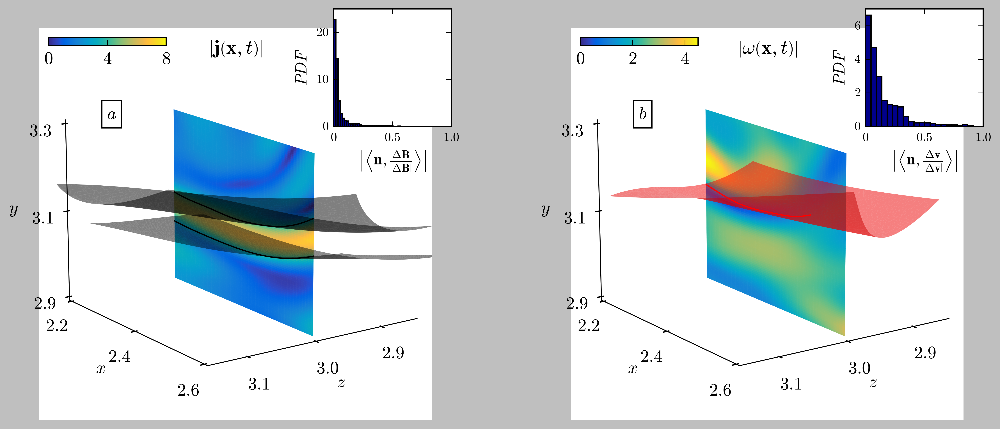

In [16]:
# activate this and deactivate 'matplotlib inline' if you want an interactive figure
# %matplotlib ipympl

%matplotlib inline

from scipy import stats
from scipy.spatial import Delaunay

azim_angle = 30

from mpl_toolkits.axes_grid1.inset_locator import mark_inset, zoomed_inset_axes, inset_axes

def colorfunction(scalar, min_value, max_value, reverse = False):
    
    cmapToUse = parula_map

    # fourth dimension - colormap
    # create colormap according to value
    color_dimension = scalar # change to desired fourth dimension
    norm = matplotlib.colors.Normalize(min_value, max_value)
    m = plt.cm.ScalarMappable(norm=norm, cmap=cmapToUse)
    m.set_array([])
    fcolors = m.to_rgba(color_dimension)
    
    return fcolors, m, cmapToUse

fontsize = 14

fig = plt.figure(figsize = (14, 12), dpi = 500)

ax0 = fig.add_subplot(221, projection='3d', computed_zorder=False)

ax_list = [ax0]

ax0.text(2.2, 3.3, 3.1, r'$a$', bbox=dict(boxstyle="square", ec="k", fc="w",), fontsize = fontsize)

for ax in ax_list:
    
    ax.set_title(r'$\left| \mathbf{j} \left(\mathbf{x}, t\right)\right|$', fontsize = fontsize+2)
    
    ax.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
    ax.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
    ax.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))

    fcolors, m, cmapToUse = colorfunction(J_domain_norm_3D[:,:,-1], 0, 8)
    ax.plot_surface(X_domain[:,:,-1], Y_domain[:,:,-1], Z_domain[:,:,-1], lw=0.1, rstride=1, cstride=1, facecolors=fcolors, vmin=0, vmax=8, shade=False)

    cbaxes = inset_axes(ax, width="30%", height="2%", loc="upper left") 
    cbar = fig.colorbar(m, cax = cbaxes, orientation="horizontal",
                    ticks = [0, 4, 8])
    cbar.ax.set_xticklabels([r'$0$', r'$4$', r'$8$'], fontsize = fontsize)

    ax.set_xticks(xticks)
    ax.set_yticks(yticks)
    ax.set_zticks([zmax-0.1, zmax, zmax+0.1])

    ax.set_xticklabels(xticklabels, fontsize = fontsize)
    ax.set_yticklabels(yticklabels, fontsize = fontsize)
    ax.set_zticklabels([r'$2.9$', r'$3.0$', r'$3.1$'], fontsize = fontsize)

    ax.set_xlabel(r'$x$', fontsize = fontsize)
    ax.set_ylabel(r'$y$', fontsize = fontsize)
    ax.set_zlabel(r'$z$', fontsize = fontsize)

    for ridge in ridges_mag:
        ax.plot(ridge[0,:], ridge[1,:], np.linspace(zmax, zmax, ridge.shape[-1]), 
              linewidth = 1, zorder = 4, c = "k")
    
    x_points, y_points, z_points = [], [], []

    for idx, surface in tqdm(enumerate(fitted_surfaces_mag), total = len(fitted_surfaces_mag)):
        
        #ax.scatter(x_points, y_points, z_points, c='k', marker='o', s = 0.25, alpha = 0.5)
        ax.plot_trisurf(surface[0,:], surface[1,:], surface[2,:], #dodgerblue
                triangles = triangles_surfaces_mag[idx].triangles, color = "k",
                alpha = 0.5, linewidth=0, antialiased=True, zorder = 2)
    
    ax.grid(False)
    
    ax.set_xlim([xmin, xmax])
    ax.set_ylim([ymin, ymax])
    ax.set_zlim([zmax-0.15, zmax+0.15])

ax1 = fig.add_subplot(222, projection='3d', computed_zorder=False)

ax1.text(2.2, 3.3, 3.1, r'$b$', bbox=dict(boxstyle="square", ec="k", fc="w",), fontsize = fontsize)

ax_list = [ax1]

for ax in ax_list:
    
    ax.set_title(r'$\left| \mathbf{\omega} \left(\mathbf{x}, t\right)\right|$', fontsize = fontsize+2)
    
    ax.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
    ax.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
    ax.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))

    fcolors, m, cmapToUse = colorfunction(Omega_domain_norm_3D[:,:,-1], 0, 4.5)
    ax.plot_surface(X_domain[:,:,-1], Y_domain[:,:,-1], Z_domain[:,:,-1], lw=0.1, rstride=1, cstride=1, facecolors=fcolors, vmin=0, vmax=4.5, shade=False)

    cbaxes = inset_axes(ax, width="30%", height="2%", loc="upper left") 
    cbar = fig.colorbar(m, cax = cbaxes, orientation="horizontal",
                    ticks = [0, 2, 4])
    cbar.ax.set_xticklabels([r'$0$', r'$2$', r'$4$'], fontsize = fontsize)

    ax.set_xticks(xticks)
    ax.set_yticks(yticks)
    ax.set_zticks([zmax-0.1, zmax, zmax+0.1])

    ax.set_xticklabels(xticklabels, fontsize = fontsize)
    ax.set_yticklabels(yticklabels, fontsize = fontsize)
    ax.set_zticklabels([r'$2.9$', r'$3.0$', r'$3.1$'], fontsize = fontsize)

    ax.set_xlabel(r'$x$', fontsize = fontsize)
    ax.set_ylabel(r'$y$', fontsize = fontsize)
    ax.set_zlabel(r'$z$', fontsize = fontsize)

    for ridge in ridges_mom:
        ax.plot(ridge[0,:], ridge[1,:], np.linspace(zmax, zmax, ridge.shape[-1]), 
              linewidth = 1, zorder = 4, c = "r")
    
    x_points, y_points, z_points = [], [], []

    for idx, surface in tqdm(enumerate(fitted_surfaces_mom), total = len(fitted_surfaces_mom)):
        ax.plot_trisurf(surface[0,:], surface[1,:], surface[2,:], #dodgerblue
                triangles = triangles_surfaces_mom[idx].triangles, color = "r",
                alpha = 0.5, linewidth=0, antialiased=True, zorder = 2)

    ax.grid(False)
    
    ax.set_xlim([xmin, xmax])
    ax.set_ylim([ymin, ymax])
    ax.set_zlim([zmax-0.15, zmax+0.15])

inset0 = [.75, .75, .3, .3]
inset1 = [.75, .75, .3, .3]

tangent_surface_magnetic = np.append(tangency_surface_mag[0].ravel(), tangency_surface_mag[1].ravel())

axins = ax0.inset_axes(inset0)
axins.hist(tangent_surface_magnetic, bins = 40, fc = "darkblue", density = True)

axins.set_xlabel(r'$\left| \left\langle \mathbf{n}, \frac{\Delta \mathbf{B}}{\left| \Delta \mathbf{B} \right|}\right\rangle \right|$', fontsize = fontsize-1)
axins.set_ylabel(r'$PDF$', fontsize = fontsize-1)

axins.set_xticks([0, 0.5, 1.0])
axins.set_xticklabels([r'$0$', r'$0.5$', r'$1.0$'], fontsize = fontsize-4)
axins.set_yticks([0, 10, 20])
axins.set_yticklabels([r'$0$', r'$10$', r'$20$'], fontsize = fontsize-4)

axins = ax1.inset_axes(inset1)
axins.hist(tangency_surface_mom[0].ravel(), bins = 20, fc = "darkblue", density = True)

axins.set_xlabel(r'$\left|\left\langle \mathbf{n}, \frac{\Delta \mathbf{v}}{\left| \Delta \mathbf{v} \right|}\right\rangle \right|$', fontsize = fontsize-1)
axins.set_ylabel(r'$PDF$', fontsize = fontsize-1)

axins.set_xticks([0, 0.5, 1.0])
axins.set_xticklabels([r'$0$', r'$0.5$', r'$1.0$'], fontsize = fontsize-4)
axins.set_yticks([0, 2, 4, 6])
axins.set_yticklabels([r'$0$', r'$2$', r'$4$', r'$6$'], fontsize = fontsize-4)

ax0.view_init(elev = 15, azim = 55, vertical_axis='y')
ax1.view_init(elev = 15, azim = 55, vertical_axis='y')

plt.savefig(r'Fig7.jpg', bbox_inches = "tight", dpi = 150)
plt.show()